In [1]:
# pip install python-dotenv

Note: you may need to restart the kernel to use updated packages.


In [1]:
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
import os
from dotenv import load_dotenv

In [2]:
load_dotenv()

api_key = os.getenv("api_key")

In [4]:
url = "https://api.nasa.gov/neo/rest/v1/feed?"

params = {"start_date": "2024-03-10", "end_date": "2024-03-17", "api_key": api_key}

In [5]:
resp = requests.get(url, params=params)

In [6]:
resp.json()

{'links': {'next': 'http://api.nasa.gov/neo/rest/v1/feed?start_date=2024-03-17&end_date=2024-03-24&detailed=false&api_key=Dq0JZYso33zM8lqR4xoYS9AGgUVFmaXkRWV600bj',
  'previous': 'http://api.nasa.gov/neo/rest/v1/feed?start_date=2024-03-03&end_date=2024-03-10&detailed=false&api_key=Dq0JZYso33zM8lqR4xoYS9AGgUVFmaXkRWV600bj',
  'self': 'http://api.nasa.gov/neo/rest/v1/feed?start_date=2024-03-10&end_date=2024-03-17&detailed=false&api_key=Dq0JZYso33zM8lqR4xoYS9AGgUVFmaXkRWV600bj'},
 'element_count': 121,
 'near_earth_objects': {'2024-03-16': [{'links': {'self': 'http://api.nasa.gov/neo/rest/v1/neo/2527977?api_key=Dq0JZYso33zM8lqR4xoYS9AGgUVFmaXkRWV600bj'},
    'id': '2527977',
    'neo_reference_id': '2527977',
    'name': '527977 (2008 EY68)',
    'nasa_jpl_url': 'https://ssd.jpl.nasa.gov/tools/sbdb_lookup.html#/?sstr=2527977',
    'absolute_magnitude_h': 22.3,
    'estimated_diameter': {'kilometers': {'estimated_diameter_min': 0.0921626549,
      'estimated_diameter_max': 0.2060819612},
 

In [8]:
ast = []
for dia in resp.json()['near_earth_objects']:
    for asteroide in resp.json()['near_earth_objects'][dia]:
        ast.append(asteroide["id"])
        
    
len(ast)

121

In [23]:
url = f"https://api.nasa.gov/neo/rest/v1/neo/{ast[0]}?api_key={api_key}"
res = requests.get(url)

res.status_code

200

In [24]:
res.json()

{'links': {'self': 'http://api.nasa.gov/neo/rest/v1/neo/2527977?api_key=Dq0JZYso33zM8lqR4xoYS9AGgUVFmaXkRWV600bj'},
 'id': '2527977',
 'neo_reference_id': '2527977',
 'name': '527977 (2008 EY68)',
 'designation': '527977',
 'nasa_jpl_url': 'https://ssd.jpl.nasa.gov/tools/sbdb_lookup.html#/?sstr=2527977',
 'absolute_magnitude_h': 22.3,
 'estimated_diameter': {'kilometers': {'estimated_diameter_min': 0.0921626549,
   'estimated_diameter_max': 0.2060819612},
  'meters': {'estimated_diameter_min': 92.1626548503,
   'estimated_diameter_max': 206.0819612321},
  'miles': {'estimated_diameter_min': 0.057267201,
   'estimated_diameter_max': 0.1280533543},
  'feet': {'estimated_diameter_min': 302.370924539,
   'estimated_diameter_max': 676.1219416887}},
 'is_potentially_hazardous_asteroid': False,
 'close_approach_data': [{'close_approach_date': '1900-03-13',
   'close_approach_date_full': '1900-Mar-13 07:18',
   'epoch_date_close_approach': -2202828120000,
   'relative_velocity': {'kilometers_p

In [33]:
params = {'api_key':api_key,
			'date': "2020-07-09"}
print("Obteniendo imagen satelital de la fecha ", params['date'])

response = requests.get('https://api.nasa.gov/planetary/apod?', params=params)

Obteniendo imagen satelital de la fecha  2020-07-09


In [34]:
response.json()

{'copyright': 'Emmanuel Paoly',
 'date': '2020-07-09',
 'explanation': "These silvery blue waves washing over a tree-lined horizon in the eastern French Alps are noctilucent clouds. From high in planet Earth's mesosphere, they reflect sunlight in this predawn skyscape taken on July 8. This summer, the night-shining clouds are not new to the northern high-latitudes. Comet NEOWISE is though. Also known as C/2020 F3, the comet was discovered in March by the Earth-orbiting Near Earth Object Wide-field Infrared Survey Explorer (NEOWISE) satellite. It's now emerging in morning twilight only just visible to the unaided eye from a clear location above the northeastern horizon.",
 'hdurl': 'https://apod.nasa.gov/apod/image/2007/noctilucentNeowisePaoly.jpg',
 'media_type': 'image',
 'service_version': 'v1',
 'title': 'Noctilucent Clouds and Comet NEOWISE',
 'url': 'https://apod.nasa.gov/apod/image/2007/noctilucentNeowisePaoly600h.jpg'}

/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


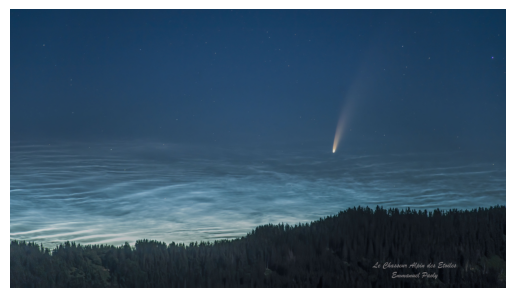

In [35]:
res = requests.get(response.json()["url"], verify=False)
img = Image.open(BytesIO(res.content))

plt.imshow(img)
plt.axis("off")
plt.savefig("imagen_nasa.jpg", bbox_inches = "tight", pad_inches=0)
plt.show();

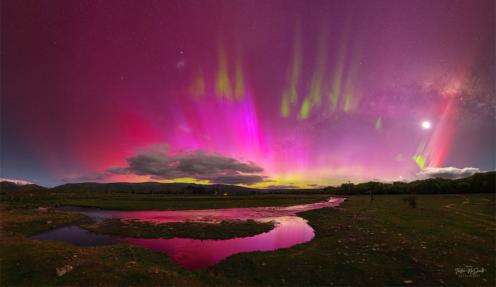

In [32]:
Image.open("imagen_nasa.jpg")

In [37]:
import time

Obteniendo imagen satelital de la fecha  2020-1-1


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


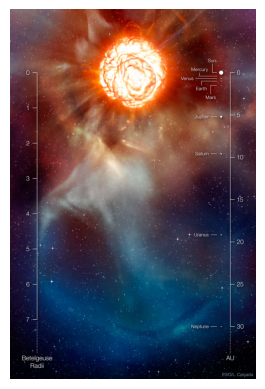

Obteniendo imagen satelital de la fecha  2020-1-2


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


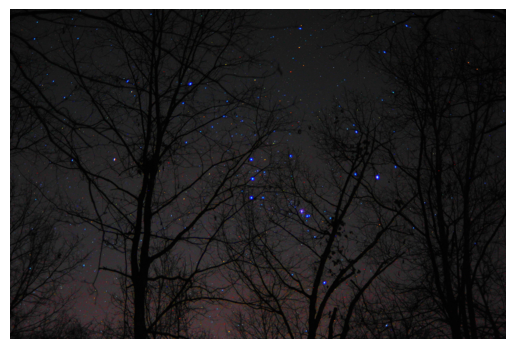

Obteniendo imagen satelital de la fecha  2020-1-3


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


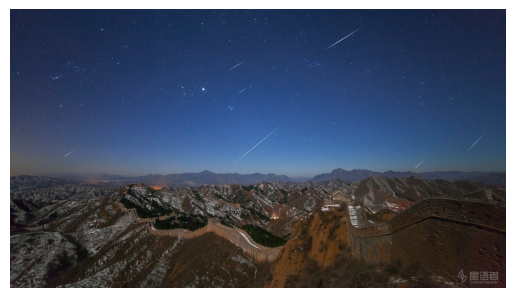

Obteniendo imagen satelital de la fecha  2020-1-4


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


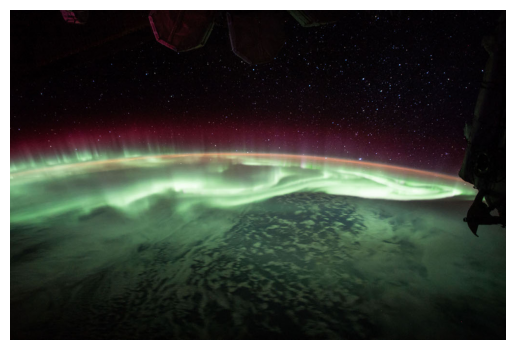

Obteniendo imagen satelital de la fecha  2020-1-5


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


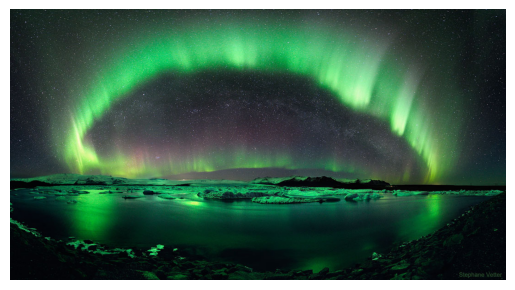

Obteniendo imagen satelital de la fecha  2020-1-6


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


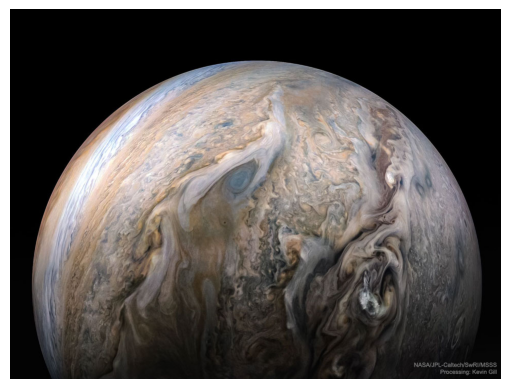

Obteniendo imagen satelital de la fecha  2020-1-7


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


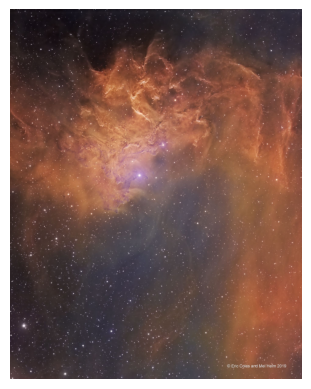

Obteniendo imagen satelital de la fecha  2020-1-8


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


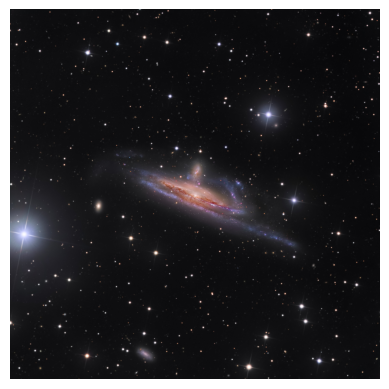

Obteniendo imagen satelital de la fecha  2020-1-9


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


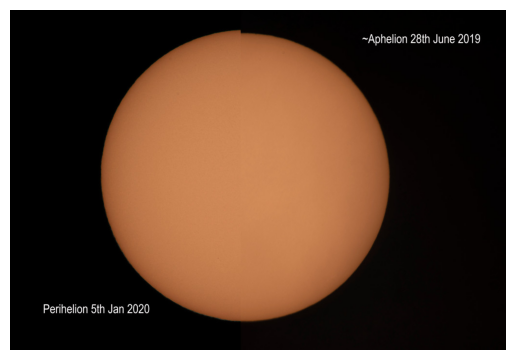

Obteniendo imagen satelital de la fecha  2020-1-10


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


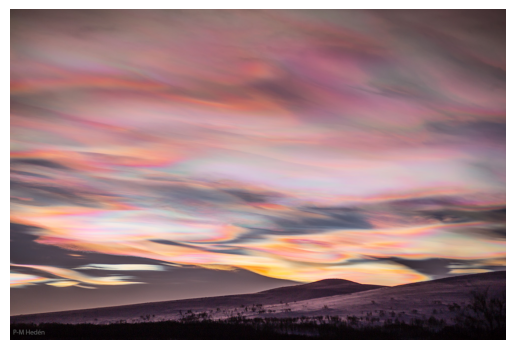

Obteniendo imagen satelital de la fecha  2020-1-11


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


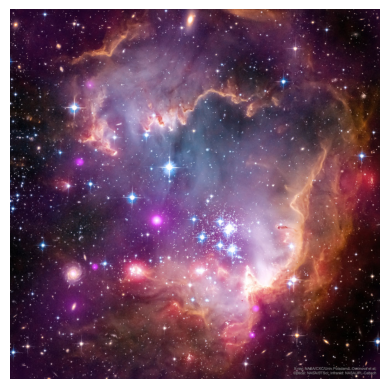

Obteniendo imagen satelital de la fecha  2020-1-12


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


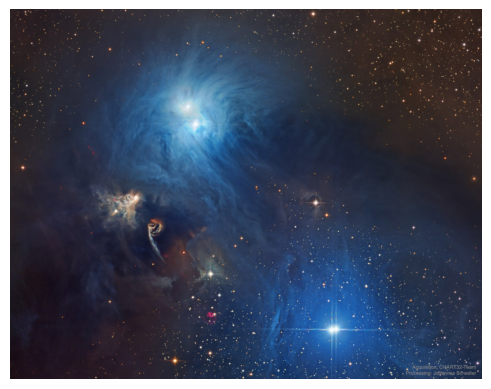

Obteniendo imagen satelital de la fecha  2020-1-13


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


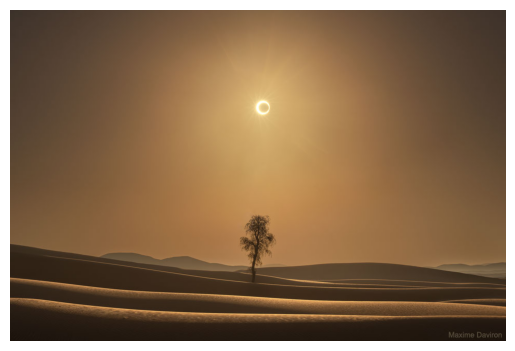

Obteniendo imagen satelital de la fecha  2020-1-14


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


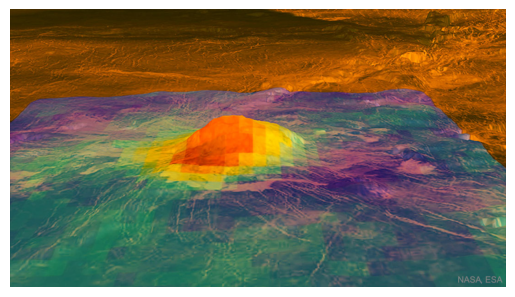

Obteniendo imagen satelital de la fecha  2020-1-15


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


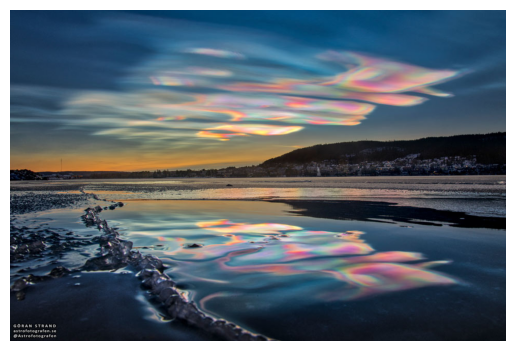

Obteniendo imagen satelital de la fecha  2020-1-16


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


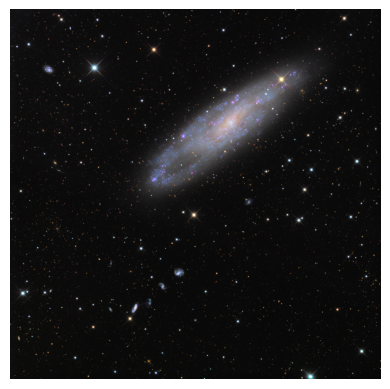

Obteniendo imagen satelital de la fecha  2020-1-17


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


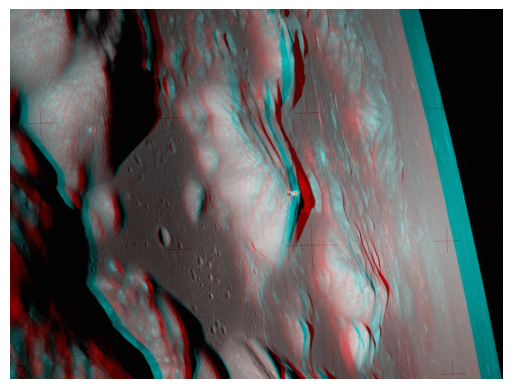

Obteniendo imagen satelital de la fecha  2020-1-18


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


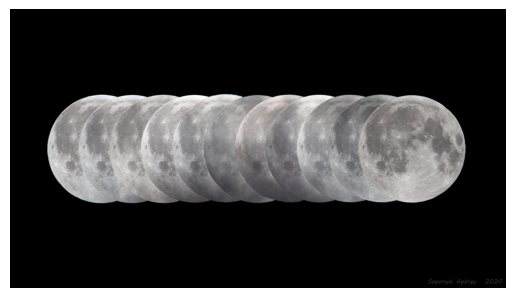

Obteniendo imagen satelital de la fecha  2020-1-19


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.youtube.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


error
Obteniendo imagen satelital de la fecha  2020-1-20


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


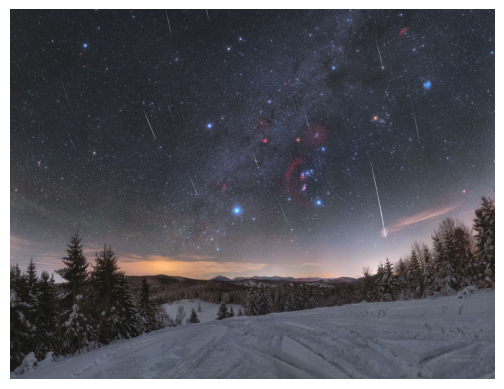

Obteniendo imagen satelital de la fecha  2020-1-21


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.youtube.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


error
Obteniendo imagen satelital de la fecha  2020-1-22


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


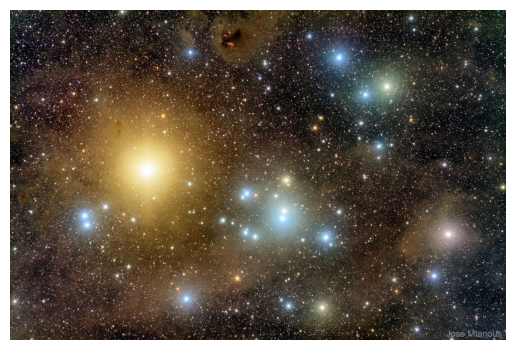

Obteniendo imagen satelital de la fecha  2020-1-23


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


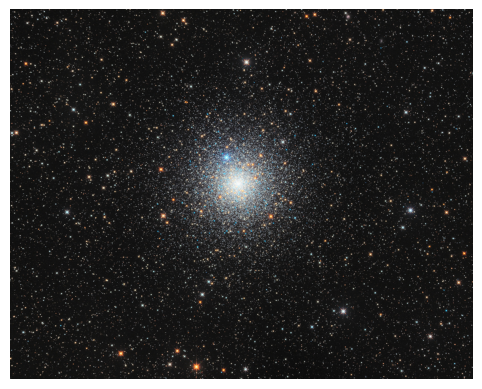

Obteniendo imagen satelital de la fecha  2020-1-24


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


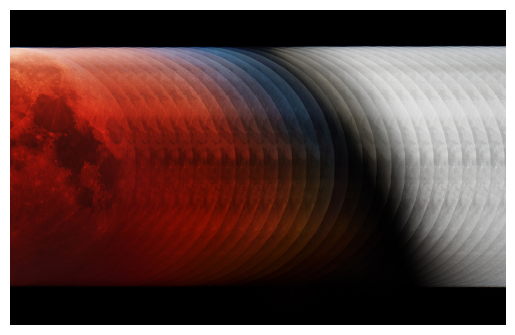

Obteniendo imagen satelital de la fecha  2020-1-25


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


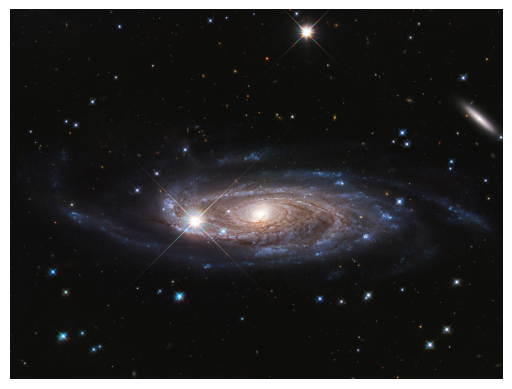

Obteniendo imagen satelital de la fecha  2020-1-26


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


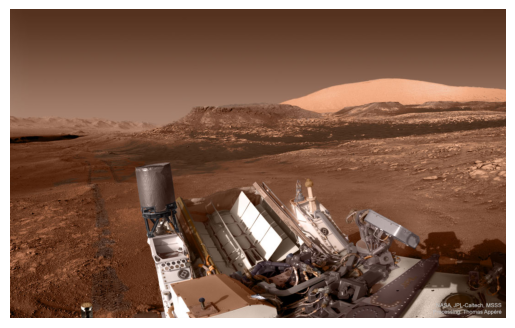

Obteniendo imagen satelital de la fecha  2020-1-27


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


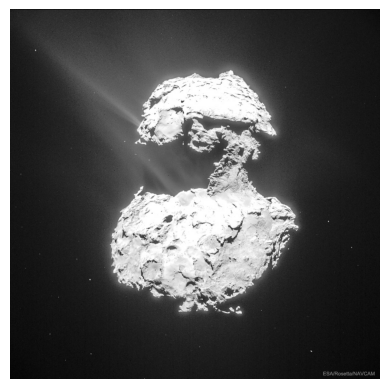

Obteniendo imagen satelital de la fecha  2020-1-28


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


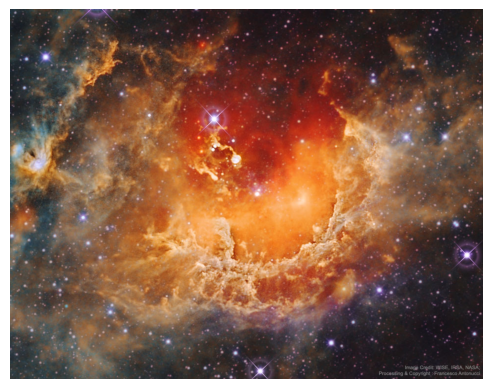

Obteniendo imagen satelital de la fecha  2020-1-29


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


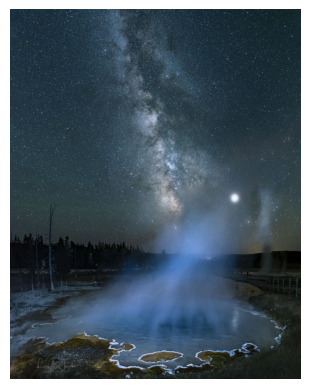

Obteniendo imagen satelital de la fecha  2020-1-30


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


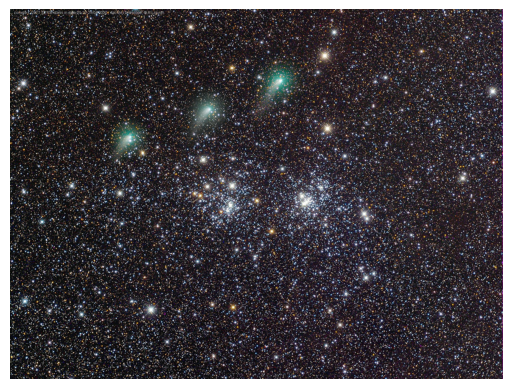

Obteniendo imagen satelital de la fecha  2020-2-1


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


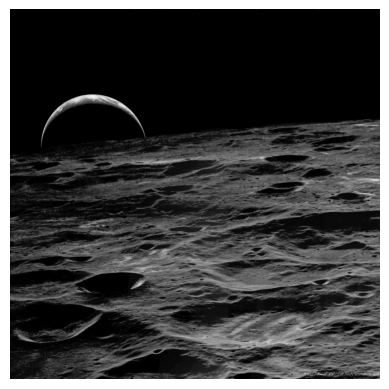

Obteniendo imagen satelital de la fecha  2020-2-2


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


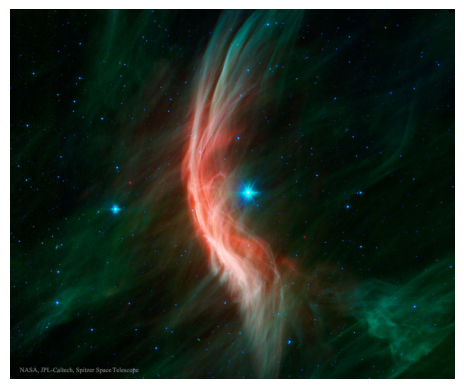

Obteniendo imagen satelital de la fecha  2020-2-3


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.youtube.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


error
Obteniendo imagen satelital de la fecha  2020-2-4


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


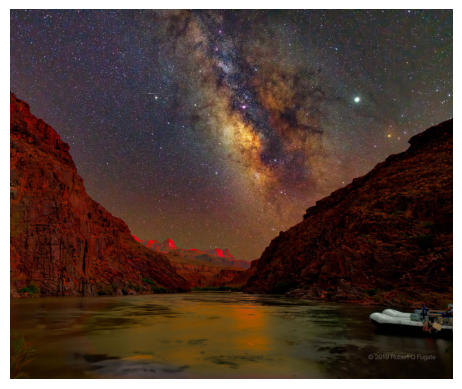

Obteniendo imagen satelital de la fecha  2020-2-5


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


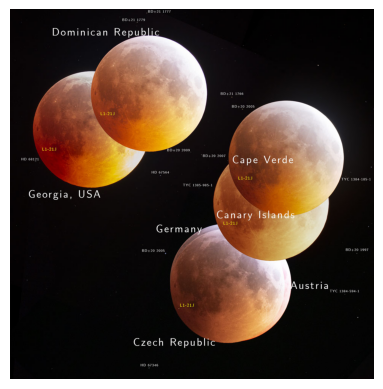

Obteniendo imagen satelital de la fecha  2020-2-6


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


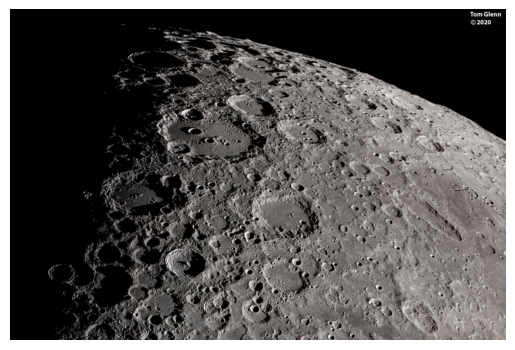

Obteniendo imagen satelital de la fecha  2020-2-7


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


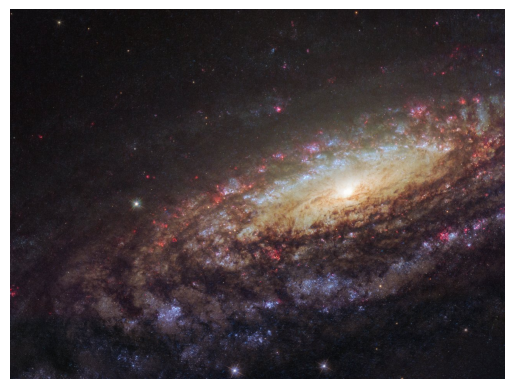

Obteniendo imagen satelital de la fecha  2020-2-8


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


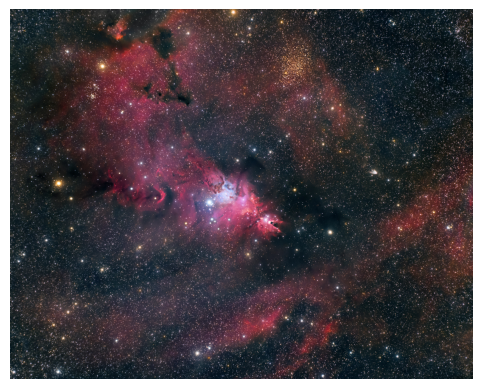

Obteniendo imagen satelital de la fecha  2020-2-9


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


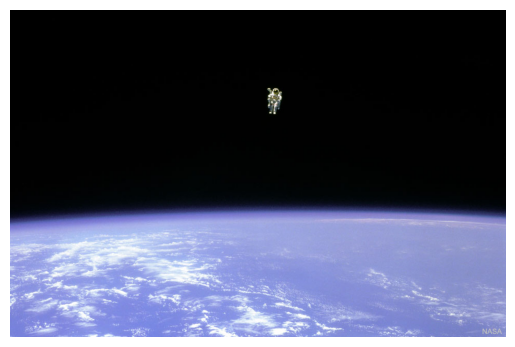

Obteniendo imagen satelital de la fecha  2020-2-10


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


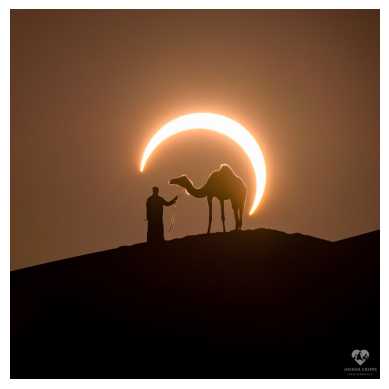

Obteniendo imagen satelital de la fecha  2020-2-11


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


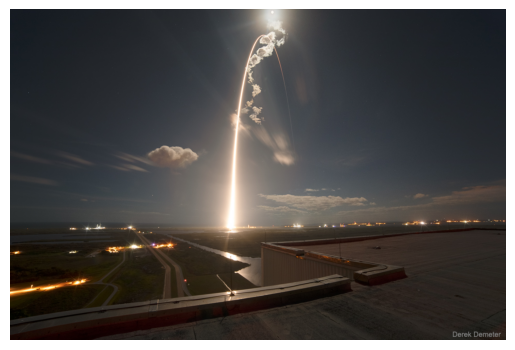

Obteniendo imagen satelital de la fecha  2020-2-12


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


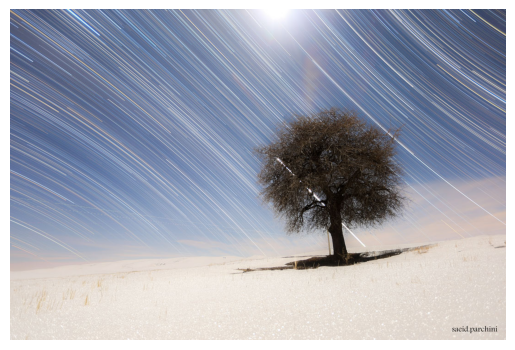

Obteniendo imagen satelital de la fecha  2020-2-13


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


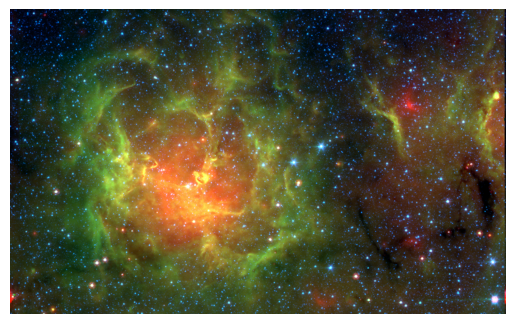

Obteniendo imagen satelital de la fecha  2020-2-14


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


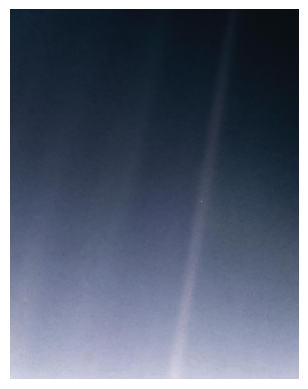

Obteniendo imagen satelital de la fecha  2020-2-15


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


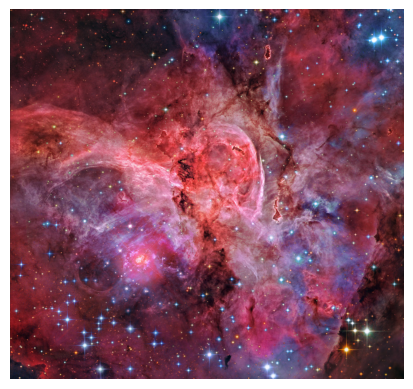

Obteniendo imagen satelital de la fecha  2020-2-16


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


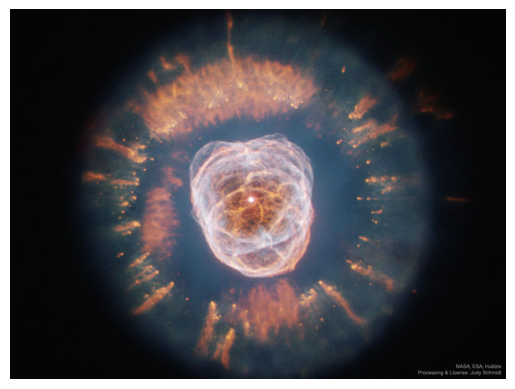

Obteniendo imagen satelital de la fecha  2020-2-17


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


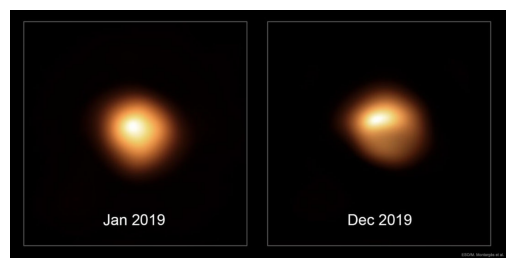

Obteniendo imagen satelital de la fecha  2020-2-18


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


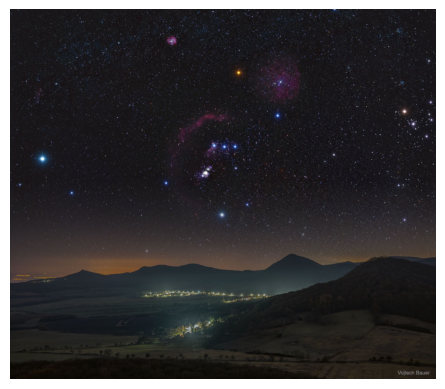

Obteniendo imagen satelital de la fecha  2020-2-19


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


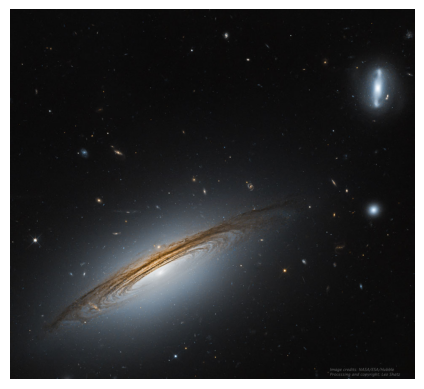

Obteniendo imagen satelital de la fecha  2020-2-20


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


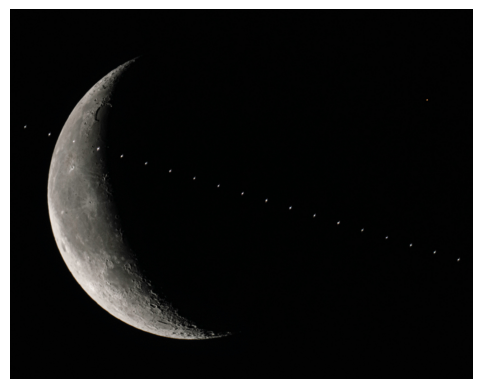

Obteniendo imagen satelital de la fecha  2020-2-21


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


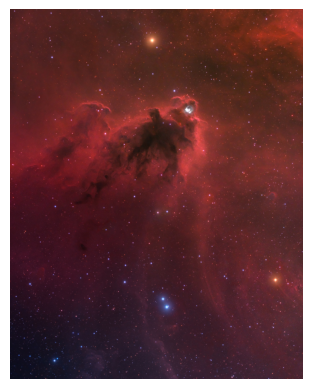

Obteniendo imagen satelital de la fecha  2020-2-22


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


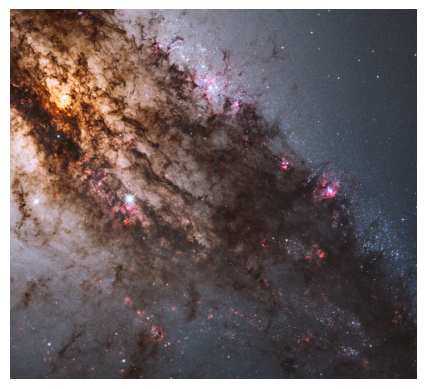

Obteniendo imagen satelital de la fecha  2020-2-23


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.youtube.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


error
Obteniendo imagen satelital de la fecha  2020-2-24


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


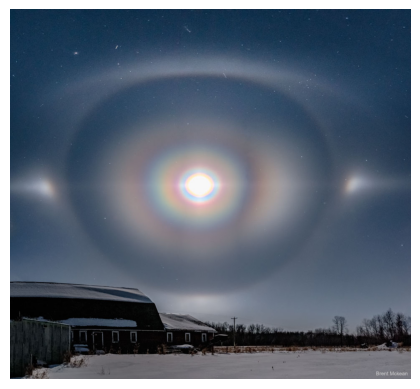

Obteniendo imagen satelital de la fecha  2020-2-25


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.youtube.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


error
Obteniendo imagen satelital de la fecha  2020-2-26


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


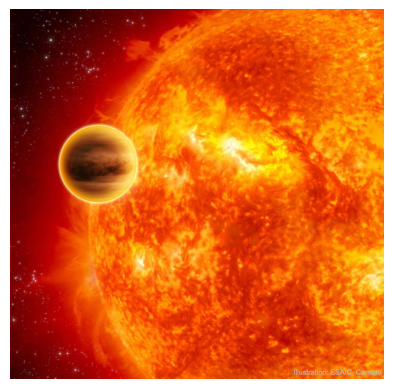

Obteniendo imagen satelital de la fecha  2020-2-27


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


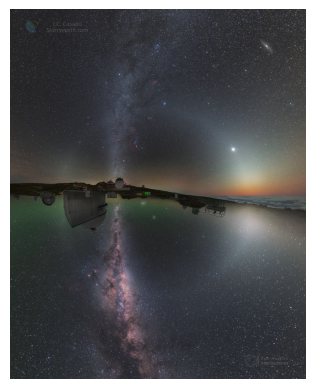

Obteniendo imagen satelital de la fecha  2020-2-28


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


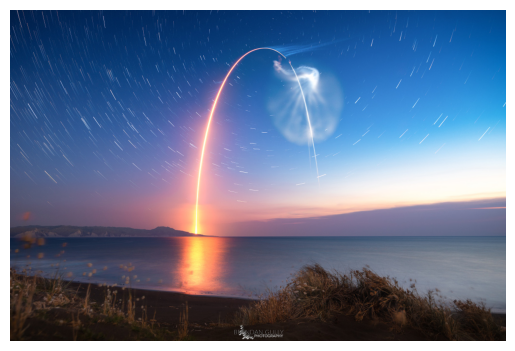

Obteniendo imagen satelital de la fecha  2020-2-29


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


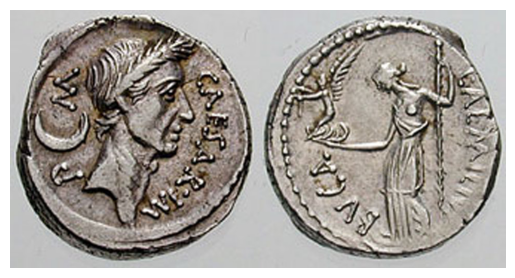

Obteniendo imagen satelital de la fecha  2020-2-30
error
Obteniendo imagen satelital de la fecha  2020-3-1


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


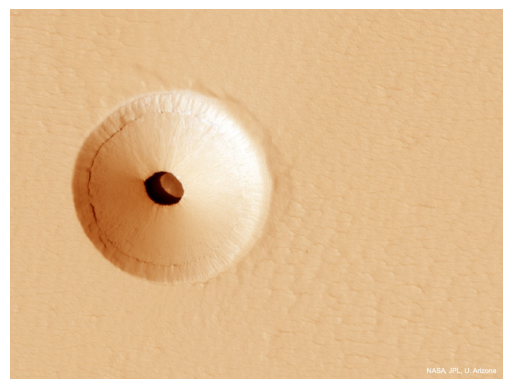

Obteniendo imagen satelital de la fecha  2020-3-2


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


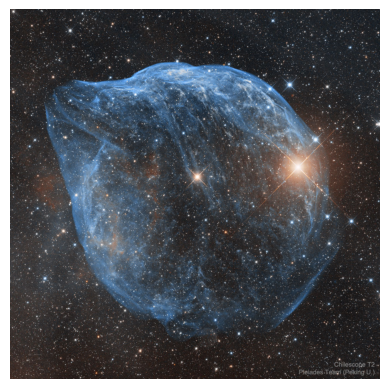

Obteniendo imagen satelital de la fecha  2020-3-3


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.youtube.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


error
Obteniendo imagen satelital de la fecha  2020-3-4


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


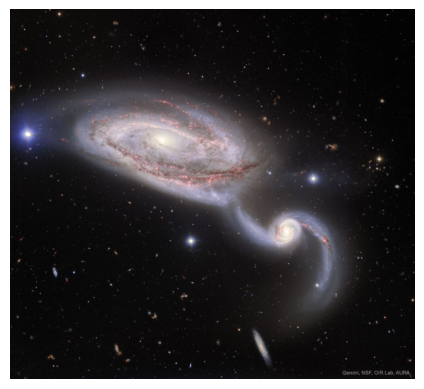

Obteniendo imagen satelital de la fecha  2020-3-5


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


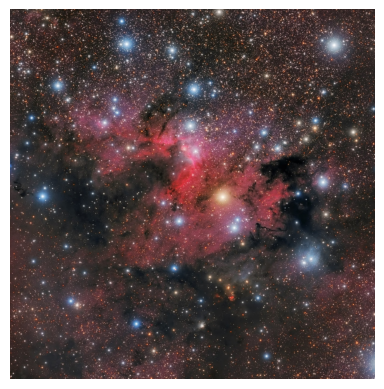

Obteniendo imagen satelital de la fecha  2020-3-6


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


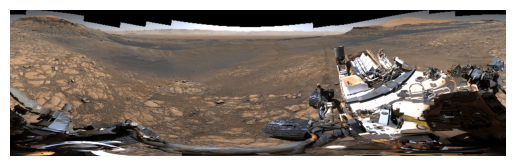

Obteniendo imagen satelital de la fecha  2020-3-7


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


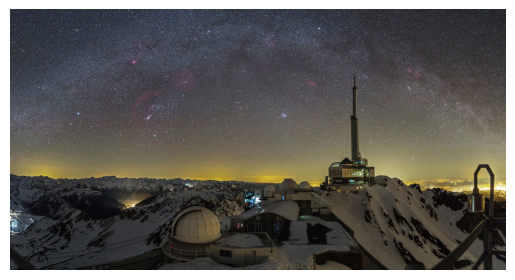

Obteniendo imagen satelital de la fecha  2020-3-8


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


error
Obteniendo imagen satelital de la fecha  2020-3-9


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


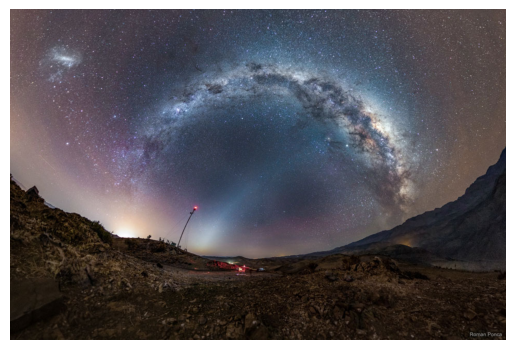

Obteniendo imagen satelital de la fecha  2020-3-10


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


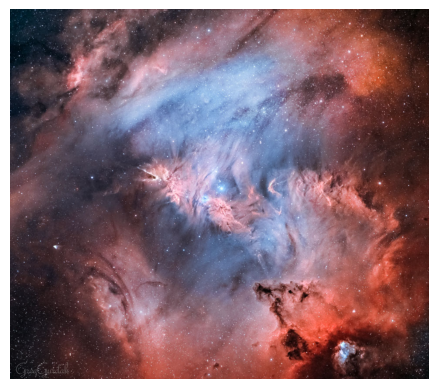

Obteniendo imagen satelital de la fecha  2020-3-11


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


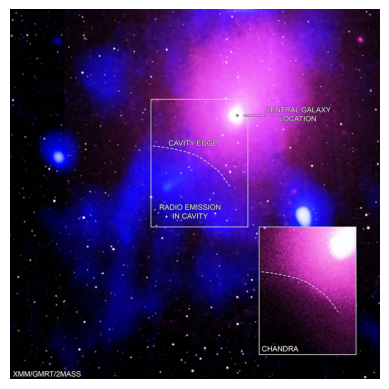

Obteniendo imagen satelital de la fecha  2020-3-12


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


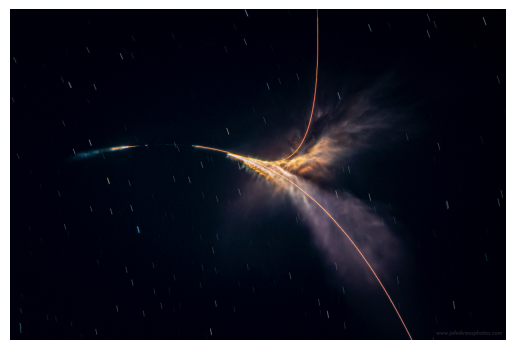

Obteniendo imagen satelital de la fecha  2020-3-13


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


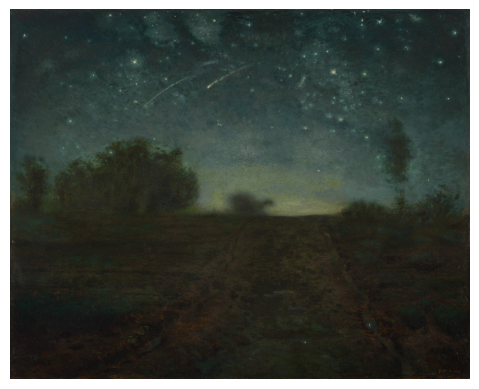

Obteniendo imagen satelital de la fecha  2020-3-14


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'apod.nasa.gov'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


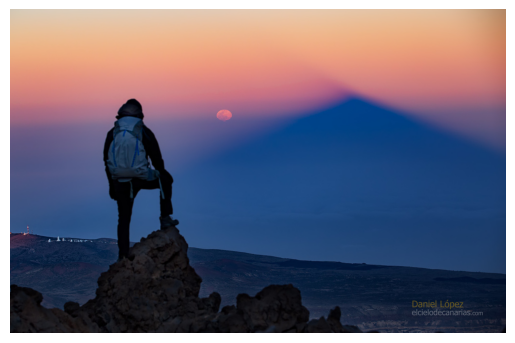

Obteniendo imagen satelital de la fecha  2020-3-15


/home/ze/anaconda3/envs/promo-i/lib/python3.11/site-packages/urllib3/connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.youtube.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


error
Obteniendo imagen satelital de la fecha  2020-3-16


In [ ]:
for año in range(2020, 2022):
    for mes in range(1, 13):
        for dia in range(1, 31):

            try:

                params = {'api_key':api_key,
                            'date': f"{año}-{mes}-{dia}"}
                print("Obteniendo imagen satelital de la fecha ", params['date'])

                response = requests.get('https://api.nasa.gov/planetary/apod?', params=params)
                response.json()
                res = requests.get(response.json()["url"], verify=False)
                img = Image.open(BytesIO(res.content))

                plt.imshow(img)
                plt.axis("off")
                #plt.savefig("imagen_nasa.jpg", bbox_inches = "tight", pad_inches=0)
                plt.show();
            except:
                print("error")
time.sleep(10)